In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3504.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3926.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3721.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3851.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3749.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3975.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3223.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3577.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3615.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3931.txt


In [2]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
!pip install -r requirements.txt  # install

Cloning into 'yolov5'...
remote: Enumerating objects: 17311, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 17311 (delta 16), reused 5 (delta 5), pack-reused 17286 (from 5)
Receiving objects: 100% (17311/17311), 16.21 MiB | 16.25 MiB/s, done.
Resolving deltas: 100% (11876/11876), done.
/kaggle/working/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 42.2 MB/s eta 0:00:00


In [3]:
import os
import random
import cv2
import numpy as np
from IPython.display import display, Image
from tqdm import tqdm 
import random
import matplotlib.pyplot as plt

import yaml

import shutil

In [4]:
from ultralytics import YOLO

# Load a model
model = YOLO("/kaggle/working/yolov5su.pt")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 17.7M/17.7M [00:00<00:00, 294MB/s]


In [5]:
# Train the model
train_results = model.train(
    data='/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml',  # path to dataset YAML
    epochs=50,  # number of training epochs
    imgsz=480,  # training image size
    device=0,# device to run on, i.e. device=0 or device=0,1,2,3 or device=cpu
    project= "/kaggle/working/training_backup",
    name="taffic", 
    optimizer="AdamW",
    verbose = True,
    cos_lr = True
)

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/working/yolov5su.pt, data=/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=0, workers=8, project=/kaggle/working/training_backup, name=taffic, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_f

100%|██████████| 755k/755k [00:00<00:00, 129MB/s]


Overriding model.yaml nc=80 with nc=14

                   from  n    params  module                                       arguments                     
  0                  -1  1      3520  ultralytics.nn.modules.conv.Conv             [3, 32, 6, 2, 2]              
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     18816  ultralytics.nn.modules.block.C3              [64, 64, 1]                   
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    115712  ultralytics.nn.modules.block.C3              [128, 128, 2]                 
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  3    625152  ultralytics.nn.modules.block.C3              [256, 256, 3]                 
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 297MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/train/labels... 3200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3200/3200 [00:27<00:00, 114.63it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels... 800 images, 0 backgrounds, 0 corrupt: 100%|██████████| 800/800 [00:06<00:00, 119.65it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid is not writeable, cache not saved.
Plotting labels to /kaggle/working/training_backup/taffic/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 4 dataloader workers
Logging results to /kaggle/working/training_backup/taffic
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.15G      1.304      1.916      1.146         95        480: 100%|██████████| 200/200 [00:42<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.73it/s]


                   all        800       2877       0.32     0.0983     0.0603      0.029

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.17G      1.352       1.61      1.192        116        480: 100%|██████████| 200/200 [00:39<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.81it/s]

                   all        800       2877      0.308      0.293      0.226      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.18G      1.308      1.464      1.157        121        480: 100%|██████████| 200/200 [00:38<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.30it/s]


                   all        800       2877      0.314      0.376      0.301      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.18G       1.22      1.327      1.129        105        480: 100%|██████████| 200/200 [00:38<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.79it/s]

                   all        800       2877      0.488      0.472      0.452      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.18G      1.175      1.259      1.104        142        480: 100%|██████████| 200/200 [00:38<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.69it/s]

                   all        800       2877      0.528      0.567      0.545      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.18G      1.114      1.141      1.072        127        480: 100%|██████████| 200/200 [00:38<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.79it/s]

                   all        800       2877      0.586       0.54      0.548      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.18G      1.091      1.125      1.066        114        480: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.65it/s]

                   all        800       2877      0.435      0.388      0.371      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.18G      1.076      1.059      1.056        101        480: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.72it/s]

                   all        800       2877      0.664      0.554      0.611      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.18G      1.036      1.008      1.033         97        480: 100%|██████████| 200/200 [00:38<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.74it/s]

                   all        800       2877      0.665      0.632      0.684      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.18G      1.012     0.9628      1.025         97        480: 100%|██████████| 200/200 [00:38<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.95it/s]


                   all        800       2877      0.732      0.653      0.737      0.557

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.18G     0.9956     0.9396      1.016         81        480: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.39it/s]


                   all        800       2877      0.705      0.641       0.69       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.18G     0.9834     0.9181      1.009        137        480: 100%|██████████| 200/200 [00:38<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.83it/s]

                   all        800       2877      0.724      0.693      0.751      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.18G     0.9622     0.8808     0.9982        131        480: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]

                   all        800       2877      0.719      0.694      0.757      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.18G     0.9418     0.8518     0.9953         59        480: 100%|██████████| 200/200 [00:39<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.59it/s]

                   all        800       2877      0.725      0.673      0.733      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.18G     0.9382     0.8408     0.9937        120        480: 100%|██████████| 200/200 [00:38<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.75it/s]


                   all        800       2877      0.781       0.73      0.805      0.629

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.18G     0.9269     0.8249     0.9845         99        480: 100%|██████████| 200/200 [00:39<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.19it/s]

                   all        800       2877      0.746      0.719       0.78      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.18G     0.9107     0.8135     0.9797        123        480: 100%|██████████| 200/200 [00:38<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.90it/s]


                   all        800       2877      0.788      0.722       0.81      0.635

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.18G     0.8827     0.7737     0.9652        131        480: 100%|██████████| 200/200 [00:38<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.75it/s]

                   all        800       2877      0.778      0.737      0.805      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.18G     0.8802     0.7736     0.9647         88        480: 100%|██████████| 200/200 [00:38<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.35it/s]

                   all        800       2877      0.774      0.749      0.809      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.18G     0.8654     0.7519     0.9642         84        480: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.80it/s]

                   all        800       2877      0.844      0.737      0.833      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.18G     0.8561     0.7242     0.9579        104        480: 100%|██████████| 200/200 [00:38<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.77it/s]

                   all        800       2877      0.851      0.779       0.85      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.18G     0.8433      0.724     0.9533         98        480: 100%|██████████| 200/200 [00:38<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.88it/s]

                   all        800       2877      0.828      0.758      0.836      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.18G     0.8421     0.7086     0.9522        126        480: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.91it/s]


                   all        800       2877      0.834      0.765      0.847      0.672

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.18G     0.8317     0.6967     0.9415        126        480: 100%|██████████| 200/200 [00:38<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.83it/s]

                   all        800       2877      0.864      0.786      0.859       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.18G     0.8221     0.6768     0.9471        112        480: 100%|██████████| 200/200 [00:38<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.45it/s]

                   all        800       2877      0.844      0.771      0.855       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.18G     0.8051     0.6633     0.9356        123        480: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.91it/s]

                   all        800       2877      0.876      0.791      0.869      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.18G     0.7941     0.6442     0.9316        101        480: 100%|██████████| 200/200 [00:38<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.32it/s]

                   all        800       2877      0.856      0.804      0.865      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.18G      0.786     0.6395     0.9301        105        480: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.79it/s]

                   all        800       2877       0.84      0.796      0.867      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.18G     0.7869     0.6362      0.935         93        480: 100%|██████████| 200/200 [00:38<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.89it/s]

                   all        800       2877      0.877      0.791      0.871      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.18G     0.7743     0.6203     0.9248        120        480: 100%|██████████| 200/200 [00:38<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.72it/s]

                   all        800       2877      0.876      0.796      0.878      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.18G     0.7601      0.605     0.9243        105        480: 100%|██████████| 200/200 [00:38<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.94it/s]

                   all        800       2877      0.861      0.808      0.877       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.18G     0.7512     0.6035      0.922        111        480: 100%|██████████| 200/200 [00:38<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.87it/s]

                   all        800       2877      0.869      0.823      0.888      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.18G     0.7384     0.5797     0.9192        115        480: 100%|██████████| 200/200 [00:38<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.52it/s]

                   all        800       2877       0.88      0.833      0.887      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.18G     0.7322      0.571     0.9118        102        480: 100%|██████████| 200/200 [00:38<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.76it/s]

                   all        800       2877      0.893      0.828      0.893       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.18G     0.7228     0.5601     0.9103         79        480: 100%|██████████| 200/200 [00:39<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.11it/s]

                   all        800       2877      0.878      0.836      0.894      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.18G     0.7159     0.5492     0.9054        120        480: 100%|██████████| 200/200 [00:38<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]

                   all        800       2877      0.899      0.823      0.895      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.18G     0.7036      0.537     0.9061        121        480: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.49it/s]

                   all        800       2877      0.909      0.826      0.901      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.18G     0.7023     0.5299     0.9044         91        480: 100%|██████████| 200/200 [00:38<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.58it/s]

                   all        800       2877      0.897      0.831      0.898      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.18G       0.69     0.5275     0.9004         86        480: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.87it/s]

                   all        800       2877      0.897      0.829      0.897      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.18G     0.6833     0.5073      0.896        108        480: 100%|██████████| 200/200 [00:38<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]

                   all        800       2877      0.904      0.845      0.901      0.758


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.18G     0.6628     0.4724      0.882         47        480: 100%|██████████| 200/200 [00:39<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.82it/s]

                   all        800       2877      0.905      0.855      0.904      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.18G     0.6482     0.4593     0.8753         47        480: 100%|██████████| 200/200 [00:38<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.51it/s]


                   all        800       2877      0.888      0.838        0.9      0.754

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.18G     0.6449     0.4556     0.8756         64        480: 100%|██████████| 200/200 [00:38<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.44it/s]

                   all        800       2877      0.901      0.854      0.904       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.18G     0.6339     0.4435     0.8691         54        480: 100%|██████████| 200/200 [00:37<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.79it/s]

                   all        800       2877      0.901      0.857      0.904      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.18G     0.6322     0.4402     0.8685         57        480: 100%|██████████| 200/200 [00:38<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.86it/s]

                   all        800       2877      0.919      0.839      0.907      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.18G     0.6255     0.4381     0.8676         54        480: 100%|██████████| 200/200 [00:37<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.44it/s]

                   all        800       2877      0.916      0.841      0.905      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.18G     0.6237     0.4327     0.8646         51        480: 100%|██████████| 200/200 [00:38<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.78it/s]

                   all        800       2877      0.908      0.856      0.908      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.18G     0.6192     0.4317     0.8649         60        480: 100%|██████████| 200/200 [00:38<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.91it/s]

                   all        800       2877      0.909      0.852      0.908      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.18G     0.6223     0.4233     0.8678         56        480: 100%|██████████| 200/200 [00:38<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.50it/s]

                   all        800       2877      0.927       0.84      0.909       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.18G     0.6161     0.4226     0.8642         33        480: 100%|██████████| 200/200 [00:37<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:05<00:00,  4.59it/s]

                   all        800       2877      0.916      0.846      0.909      0.772



50 epochs completed in 0.625 hours.
Optimizer stripped from /kaggle/working/training_backup/taffic/weights/last.pt, 18.5MB
Optimizer stripped from /kaggle/working/training_backup/taffic/weights/best.pt, 18.5MB

Validating /kaggle/working/training_backup/taffic/weights/best.pt...
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv5s summary (fused): 84 layers, 9,116,954 parameters, 0 gradients, 23.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.10it/s]


                   all        800       2877       0.92      0.844      0.909      0.771
                  trak        113        120      0.908      0.933      0.969      0.897
               cyclist        188        234      0.878      0.731        0.8      0.626
                  bike        340        486      0.959      0.811      0.915      0.733
                 tempo        123        134       0.95      0.854      0.931      0.795
                   car        307        524      0.963      0.805      0.923      0.751
                  zeep         78         79      0.878      0.728       0.84      0.756
                  toto         63         66      0.978      0.955      0.966      0.877
            e-rickshaw         53         54      0.912      0.981      0.981      0.867
         auto-rickshaw        145        192      0.947       0.76      0.876      0.674
                   bus         83         91      0.913      0.918      0.955      0.829
                   va

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 1.5ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /kaggle/working/training_backup/taffic


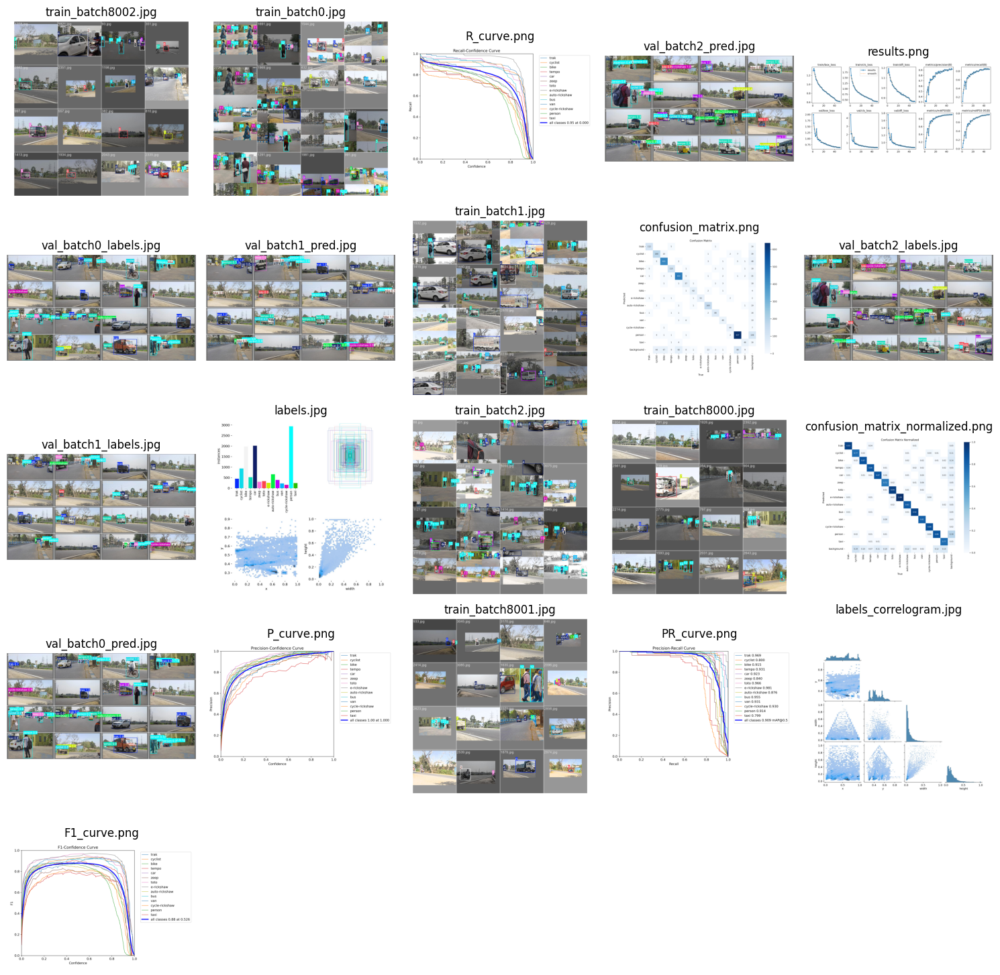

In [6]:
def display_images_from_folder(folder_path):
    """
    Finds and displays all .jpg, .png, and .jpeg images from a specified folder.
    """
    # Supported image extensions
    valid_extensions = ('.jpg', '.jpeg', '.png')
    
    # List to store images
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if not image_files:
        print("No valid images found in the specified folder.")
        return

    # Plotting images
    plt.figure(figsize=(15, 15))
    for i, image_file in enumerate(image_files):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        plt.subplot(5, 5, i+1)  # Adjust the grid size (5, 5) as needed
        plt.imshow(image_rgb)
        plt.title(image_file)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
display_images_from_folder("/kaggle/working/training_backup/taffic")


image 1/1 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3480.jpg: 288x480 1 cyclist, 1 zeep, 1 cycle-rickshaw, 38.0ms
Speed: 1.6ms preprocess, 38.0ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 480)

image 1/1 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3415.jpg: 288x480 1 car, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 480)

image 1/1 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3809.jpg: 288x480 1 trak, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 480)

image 1/1 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3884.jpg: 288x480 2 cycle-rickshaws, 3 persons, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 480)

image 1/1 /kaggle/input/iruvd-dataset-for-automatic-vehicle

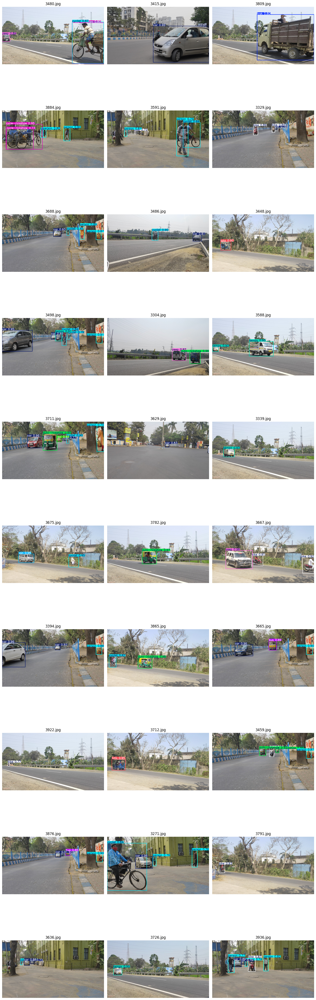

In [7]:
def run_yolov5(image_dir, model_path, total_image=30, output_folder="/kaggle/working/result_vis"):
    # Load the YOLOv11 model
    model = YOLO(model_path)
    
    # Ensure the output folder exists
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Loop through all images in the directory
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    
    # Select the specified number of random images or all images if total_image is -1
    if total_image == -1:
        selected_files = image_files
    else:
        selected_files = random.sample(image_files, min(total_image, len(image_files)))

    result_images = []  # List to hold result images

    for image_file in selected_files:
        # Load the image
        image_path = os.path.join(image_dir, image_file)
        image = cv2.imread(image_path)

        # Run YOLOv5 segmentation prediction
        results = model.predict(image_path, conf=0.7, iou=0.7)
        
        # Get the segmented mask and draw it on the image
        result_image = results[0].plot()
        
        # Save the result image in the output folder
        output_image_path = os.path.join(output_folder, image_file)
        cv2.imwrite(output_image_path, result_image)
        
        # Append the result image to the list
        result_images.append(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB

    # Display all result images in a grid
    num_images = len(result_images)
    cols = 3  # Number of columns for the grid
    rows = (num_images + cols - 1) // cols  # Calculate the number of rows needed

    plt.figure(figsize=(15, 5 * rows))  # Adjust the figure size as needed
    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(result_images[i])
        plt.axis('off')
        plt.title(selected_files[i])  # Optionally add titles

    plt.tight_layout()
    plt.show()



run_yolov5("/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images", model_path = "/kaggle/working/training_backup/taffic/weights/best.pt")

In [8]:
# Export the model to ONNX format
path = model.export(format="onnx")  # return path to exported model


Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.00GHz)
YOLOv5s summary (fused): 84 layers, 9,116,954 parameters, 0 gradients, 23.9 GFLOPs

PyTorch: starting from '/kaggle/working/training_backup/taffic/weights/best.pt' with input shape (1, 3, 480, 480) BCHW and output shape(s) (1, 18, 4725) (17.6 MB)
requirements: Ultralytics requirements ['onnxslim', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.1/144.1 kB 46.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.8/280.8 MB 55.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 230.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 308.1 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 13.0s, installed 2 packages: ['onnxslim', 'onnxruntime-gpu']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming wit